---
numbering: false
---

# 1.1: What is linear algebra?

Welcome to Math 124! The title of the course is _Vectors, Matrices, and Applications_. Vectors and matrices are the central objects of study in **linear algebra**, a branch of mathematics that has applications that touch all aspects of our daily lives.

We'll introduce vectors in [Chapter 1.4](./01-04.ipynb), and matrices in Chapter 3. For now, let's start with an object that you are already familiar with: a line.

---

## Constant rate of change

### Lines

Consider the equation

$$
y=2x+1.
$$

This equation represents a line in slope-intercept form, $y = mx+b$, with a slope of $2$ and a $y$-intercept of $1$.

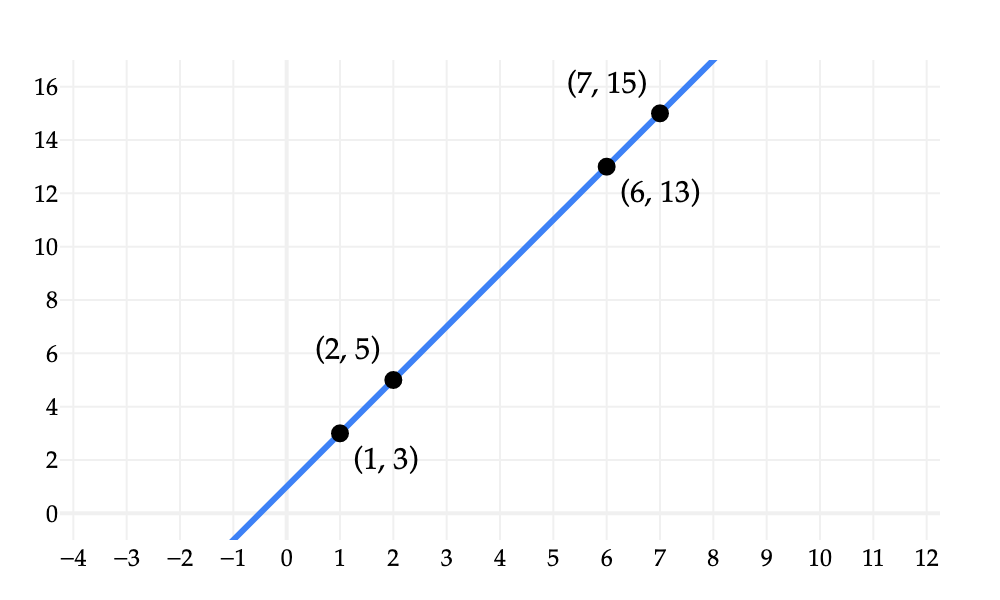

In [1]:
import numpy as np
import plotly.graph_objects as go
import plotly.io as pio

x = np.linspace(-3, 8.5, 300)
y = 2 * x + 1
fig = go.Figure()
fig.add_trace(go.Scatter(
    x=x, y=y, mode="lines", line=dict(color="#3d81f6", width=3),
    hoverinfo="skip", showlegend=False,
))

points_x = [1, 2, 6, 7]
points_y = [3, 5, 13, 15]
fig.add_trace(go.Scatter(
    x=points_x, y=points_y, mode="markers+text",
    text=["(1, 3)", "(2, 5)", "(6, 13)", "(7, 15)"],
    textposition=["bottom right", "top left", "bottom right", "top left"],
    marker=dict(color="black", size=9),
    hoverinfo="skip", showlegend=False, name="labeled points",
))

fig.update_layout(
    width=500, height=300, font_family="Palatino",
    margin=dict(l=30, r=30, t=30, b=30),
)
from pathlib import Path as _PlotPath
import sys as _plot_sys
_notes_root = next(path for path in [_PlotPath.cwd(), *_PlotPath.cwd().parents] if (path / "myst.yml").exists())
if str(_notes_root) not in _plot_sys.path:
    _plot_sys.path.insert(0, str(_notes_root))
from plot_style import style_plotly as _style_plotly

_style_plotly(fig, renderer="png")
fig.update_xaxes(
    range=[-0.5, 8.5], showgrid=True, gridcolor="#f0f0f0", dtick=1,
    showticklabels=True, ticks="", tickfont=dict(color="black"),
    zeroline=True, zerolinecolor="#f0f0f0", zerolinewidth=2,
)
fig.update_yaxes(
    range=[-1, 17], showgrid=True, gridcolor="#f0f0f0", dtick=2,
    showticklabels=True, ticks="", tickfont=dict(color="black"),
    zeroline=True, zerolinecolor="#f0f0f0", zerolinewidth=2,
    scaleanchor="x", scaleratio=0.5,
)
fig.update_traces(marker=dict(color="black", size=9),
                  textfont=dict(color="black", family="Palatino", size=15),
                  selector=dict(name="labeled points"))
fig.show(scale=2)


Draw your attention to the fact that this line's rate of change is **constant**:

- From $x=1$ to $x=2$, the value of $y$ increases by $2$.
- From $x=6$ to $x=7$, the value of $y$ also changes by $2$.
- From $x=2$ to $x=6$, the value of $y$ changes by $8$, which is $6 - 2 = 4$ times the amount it changed when we varied the $x$-value by $1$.

This constant rate of change, or **flatness**, is what we want you to associate with linear objects.

**Note**: For reasons we will see later in the term, the line $y = 2x + 1$ is technically not a _linear function_, which is a formal term. Why? It does not pass through the origin, $(0, 0)$, as a result of it having a $y$-intercept of $1$ rather than $0$. Keep that thought at the back of your mind for now.

### Planes

How does the idea of "flatness" extend from two dimensions to three? The natural extension of a line in 2D is a **plane** in 3D, like

$$z = 2x - 3y.$$

In [2]:
import numpy as np
import plotly.graph_objects as go
import plotly.io as pio

x = np.linspace(-2, 2, 25)
y = np.linspace(-2, 2, 25)
xx, yy = np.meshgrid(x, y)
zz = 2 * xx - 3 * yy

fig = go.Figure(go.Surface(
    x=xx, y=yy, z=zz, opacity=0.72, showscale=False,
    hovertemplate="x=%{x:.1f}<br>y=%{y:.1f}<br>z=%{z:.1f}<extra></extra>",
))
fig.add_trace(go.Scatter3d(
    x=x, y=np.zeros_like(x), z=2*x, mode="lines",
    name=r"slope +2 in the x-direction", line=dict(width=7),
))
fig.add_trace(go.Scatter3d(
    x=np.zeros_like(y), y=y, z=-3*y, mode="lines",
    name=r"slope -3 in the y-direction", line=dict(width=7),
))
fig.update_layout(
    width=600, height=700,
    legend=dict(orientation="h", x=0.5, xanchor="center", y=-0.08, yanchor="top"),
    margin=dict(b=90),
    scene=dict(
        xaxis_title="x", yaxis_title="y", zaxis_title="z", aspectmode="cube",
    ),
)
from pathlib import Path as _PlotPath
import sys as _plot_sys
_notes_root = next(path for path in [_PlotPath.cwd(), *_PlotPath.cwd().parents] if (path / "myst.yml").exists())
if str(_notes_root) not in _plot_sys.path:
    _plot_sys.path.insert(0, str(_notes_root))
from plot_style import style_plotly as _style_plotly

_style_plotly(fig, renderer="plotly_mimetype")
fig.show()


A plane is a flat object in three dimensional space. Instead of one "slope" or rate of change, it has two: one in the $x$-direction and one in the $y$-direction. You should imagine this plane as being a flat sheet of paper, extending infinitely in all directions, floating above the ground (the $xy$-plane).

The plot above is interactive:
- Rotate it so that the $x$-axis increases from left to right. You should see that the plane is sloped **up** and to the right, because the coefficient on $x$ in $$z = 2x - 3y$$ is positive.
- Now, rotate it so that the $y$-axis increases from left to right. You should now see that the plane is sloped **down** and to the right (and more steeply than the $x$-slope increases), because the coefficient on $y$ in the equation for the plane is negative.

:::{warning} This is just a preview!
Lines and planes will both be covered extensively throughout the course. Don't feel like you need to already understand everything about planes yet – this is just a preview! If you'd like, go to [Desmos](https://www.desmos.com/3d/tjcqs48b3z) to visualize more planes in 3D. The plane $z = 2x - 3y$ has been pre-loaded for you at that link.
:::

---

## Why study linear algebra?

But, you may ask, why do we care so much about flat objects with constant rates of change? Lots of real-world problems involve non-constant rates of change. One example you may remember is from kinematics in physics: the position $x(t)$ at time $t$ of an object with an initial position of $x_0$, initial velocity of $v_0$, and constant acceleration of $a$ is

$$x(t) = x_0 + v_0t + \frac{1}{2}at^2.$$

The rate of change of position is not constant anytime $a \neq 0$ – when you accelerate in your car, for example, you are speeding up.

Real engineering systems are messy, even messier than this example from kinematics. Materials bend, air becomes turbulent, sensors saturate, and people behave unpredictably. Why should linear algebra help? We have two answers.

**First, linear relationships can model complex phenomenon.**<br>
Sometimes, the complexity of a system comes from the fact that there are several variables, but connected by simple linear constraints, e.g. the forces acting upon an object must sum to 0 if it is not moving. One such relationship may be easy. Hundreds of them occurring simultaneously produce a **system of linear equations**. Linear algebra gives us a way to organize the whole system and reason about all of its unknown quantities at once.

**Second, we can find linear approximations of nonlinear relationships.**<br>A curved road is not straight. But if we zoom in around one point, a short piece of it may look almost like a line. See this visualized below: if you hover over the graph with your mouse or finger, you will see buttons that allow you to zoom in and out. If we zoom in close enough, the degree 5 polynomial (which has lots of bends and is non-linear) looks just like its tangent line!

In [3]:
import numpy as np
import plotly.graph_objects as go

def polynomial(x):
    return 0.12 * x**5 - 0.6 * x**3 + x + 1

x = np.linspace(-2.5, 2.5, 400)
x0 = 0.5
y0 = polynomial(x0)
slope = 0.6 * x0**4 - 1.8 * x0**2 + 1
tangent = y0 + slope * (x - x0)

fig = go.Figure()
fig.add_trace(go.Scatter(
    x=x, y=polynomial(x), mode="lines", name="degree-5 polynomial",
    line=dict(color="#3d81f6", width=3), hoverinfo="skip",
))
fig.add_trace(go.Scatter(
    x=x, y=tangent, mode="lines", name="tangent line",
    line=dict(color="orange", width=3), hoverinfo="skip",
))
fig.update_layout(
    width=500, height=300, font_family="Palatino",
    legend=dict(orientation="h", x=0.5, xanchor="center", y=-0.18, yanchor="top"),
    margin=dict(l=30, r=30, t=30, b=65),
)
from pathlib import Path as _PlotPath
import sys as _plot_sys
_notes_root = next(path for path in [_PlotPath.cwd(), *_PlotPath.cwd().parents] if (path / "myst.yml").exists())
if str(_notes_root) not in _plot_sys.path:
    _plot_sys.path.insert(0, str(_notes_root))
from plot_style import style_plotly as _style_plotly

_style_plotly(fig, renderer="plotly_mimetype")
fig.update_xaxes(
    range=[-0.1, 1.1], dtick=0.2, showgrid=True, gridcolor="#f0f0f0",
    showticklabels=True, ticks="", tickfont=dict(color="black"),
    zeroline=True, zerolinecolor="#f0f0f0", zerolinewidth=2,
)
fig.update_yaxes(
    range=[0.9, 1.9], dtick=0.2, showgrid=True, gridcolor="#f0f0f0",
    showticklabels=True, ticks="", tickfont=dict(color="black"),
    zeroline=True, zerolinecolor="#f0f0f0", zerolinewidth=2,
)
fig.show(config=dict(scrollZoom=True, displaylogo=False, responsive=True))


The same idea works for far more complicated systems: even when a system is nonlinear overall, if we zoom in enough, its behavior can often be approximated by something linear. Constructing and understanding these local approximations is one of the major ideas of calculus, which you will study in Math 125. Linear algebra is not merely a part of calculus, though. It also studies linear systems directly and gives us the language needed to work with many variables at once.

---

## Engineering applications

Let us show you a few examples of how linear algebra can be applied to real problems from various engineering domains.

:::{warning} Focus on the ideas, not the math!
Our only goal is here is to convince you that linear algebra has some applicability. You are **not** responsible for any of the math that appears here; any of the relevant ideas will be introduced from scratch throughout the semester. Focus on the big picture!
:::


### Example 1: Water flow

When you turn on a faucet in your kitchen or bathroom, water appears almost immediately. But before it reaches your sink, that water has traveled through a surprisingly complex network of reservoirs, pumps, pipes, and junctions. Engineers designing these systems need to make sure that enough water can flow through the network to meet demand throughout the city.

To illustrate, consider the small water network below. Water enters at junction $A$ and travels through three pipes:

- $47$ liters per second (L/s) enters the network at $A$;
- $14$ L/s leaves the network at $B$ (say, to a neighborhood that has its own water control system);
- $33$ L/s leaves the network at $C$;
- $x$, $y$, and $z$ are the flows through the three internal pipes;
- a flow meter tells us that $z=8$ L/s.

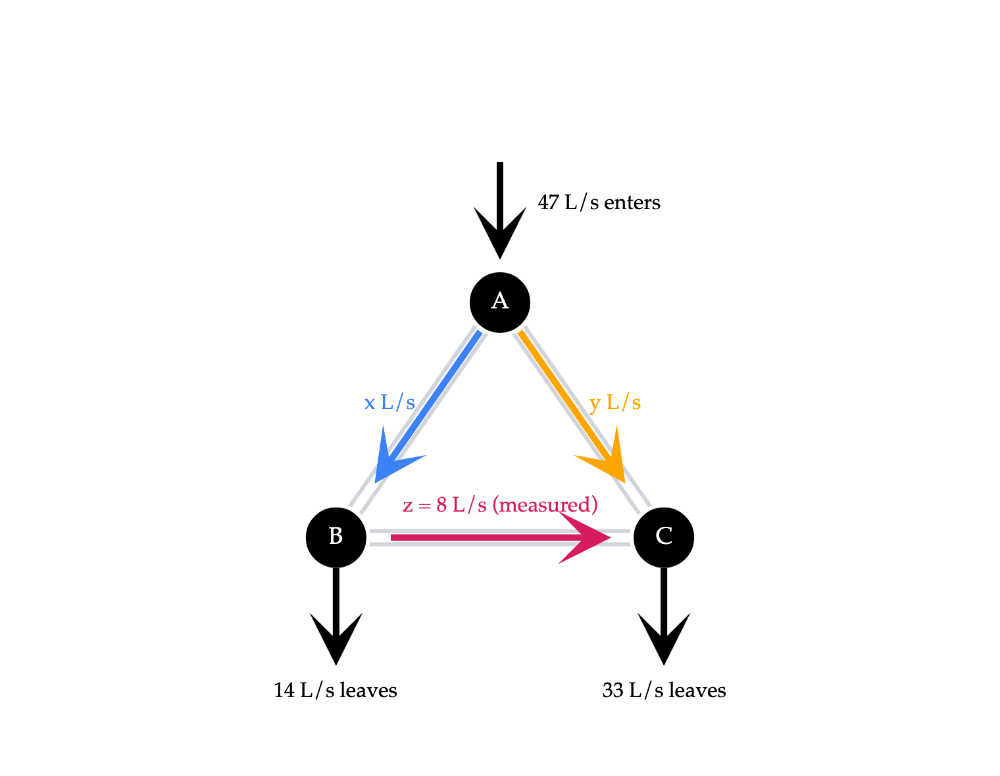

In [4]:
import plotly.graph_objects as go

A = (0.0, 1.65)
B = (-1.15, 0.0)
C = (1.15, 0.0)

fig = go.Figure()

# Draw the pipes beneath the flow arrows.
for start, end in [(A, B), (A, C), (B, C)]:
    fig.add_shape(
        type="line", x0=start[0], y0=start[1], x1=end[0], y1=end[1],
        line=dict(color="#d1d5db", width=13), layer="below",
    )
    fig.add_shape(
        type="line", x0=start[0], y0=start[1], x1=end[0], y1=end[1],
        line=dict(color="white", width=7), layer="below",
    )

fig.add_trace(go.Scatter(
    x=[A[0], B[0], C[0]], y=[A[1], B[1], C[1]],
    mode="markers+text", name="junctions", text=["A", "B", "C"],
    textposition="middle center",
    marker=dict(color="black", size=49, line=dict(color="white", width=3)),
    textfont=dict(color="white", size=18), hoverinfo="skip", showlegend=False,
))

fig.update_layout(
    # title=dict(text="Conservation of flow through a small water network",
    #            x=0.5, xanchor="center", y=0.97, yanchor="top"),
    width=760, height=590, margin=dict(l=35, r=35, t=100, b=35),
    xaxis=dict(range=[-2.05, 2.05], visible=False),
    yaxis=dict(range=[-1.35, 2.85], visible=False, scaleanchor="x"),
    showlegend=False,
)

from pathlib import Path as _PlotPath
import sys as _plot_sys
_notes_root = next(path for path in [_PlotPath.cwd(), *_PlotPath.cwd().parents]
                   if (path / "myst.yml").exists())
if str(_notes_root) not in _plot_sys.path:
    _plot_sys.path.insert(0, str(_notes_root))
from plot_style import style_plotly as _style_plotly

_style_plotly(fig, renderer="png")
fig.update_traces(marker_color="black", marker_line_color="white",
                  textfont_color="white", selector=dict(name="junctions"))

def flow_arrow(start, end, color):
    fig.add_annotation(
        x=end[0], y=end[1], ax=start[0], ay=start[1],
        xref="x", yref="y", axref="x", ayref="y",
        text="", showarrow=True, arrowhead=3, arrowsize=1.35,
        arrowwidth=5, arrowcolor=color,
    )

# External flows.
flow_arrow((0, 2.65), (0, 1.95), "black")
flow_arrow((-1.15, -0.20), (-1.15, -0.90), "black")
flow_arrow((1.15, -0.20), (1.15, -0.90), "black")

# Internal flows x, y, and z use the course's categorical palette.
flow_arrow((-0.13, 1.46), (-0.88, 0.38), "#3d81f6")
flow_arrow((0.13, 1.46), (0.88, 0.38), "orange")
flow_arrow((-0.78, 0.00), (0.78, 0.00), "#d81a60")

labels = [
    (0.7, 2.34, "47 L/s enters", "black"),
    (-0.77, 0.94, "x L/s", "#3d81f6"),
    (0.81, 0.94, "y L/s", "orange"),
    (0.00, 0.22, "z = 8 L/s (measured)", "#d81a60"),
    (-1.15, -1.08, "14 L/s leaves", "black"),
    (1.15, -1.08, "33 L/s leaves", "black"),
]
for x_pos, y_pos, label, color in labels:
    fig.add_annotation(
        x=x_pos, y=y_pos, text=label, showarrow=False,
        font=dict(color=color, size=16),
    )

fig.show(scale=2)


At each junction, the total amount of water flowing **in** must be the same as the total amount of water flowing **out**. In other words, all of the water in the system must be accounted for.

**Key idea**: the system above obeys a system of linear equations! We can use this system to determine the rate of flow from $A$ to $B$ ($x$) and from $A$ to $C$ ($y$).

- At junction $A$, the incoming water splits between the two outgoing pipes. Since the flow into $A$ is $47$ L/s and the flow out of $A$ is $x+y$, we must have $$x+y = 47.$$
- At junction $B$, the incoming flow $x$ splits into the measured flow $z$ and the $14$ L/s that leaves the network:$$x = z+14.$$
- At junction $C$, the flows $y$ and $z$ combine before $33$ L/s leaves the network: $$y+z=33.$$

Thus, conservation turns the engineering problem into the linear system

$$
\begin{aligned}
x+y&=47,\\
x-z&=14,\\
y+z&=33.
\end{aligned}
$$

The meter reading $z=8$ can be plugged into the second and third equations to tell us that

$$
x=22,
\qquad
y=25.
$$

Notice that the three conservation equations are not independent: the third equation comes from subtracting the second equation from the first. This is because the total inflow, $47$ L/s, equals the total outflow, $14+33=47$ L/s. Without the meter reading for $z$, conservation alone would leave many possible internal flows. This is the type of question we will use linear algebra to answer: do we have enough information to uniquely determine every unknown?

Now imagine we have tens of thousands of such junctions, resulting in tens of thousands of equations. Linear algebra is the tool for solving such problems. Here, the example involve water conservation – flow in equals flow out – but similar rules appear all throughout science and engineering, resulting in similar systems in a variety of domains.

:::{tip} Activity 1
_Throughout these notes, you will see boxes like these, with activities for you to work on while reading the notes. These are essential practice._

Name two other laws you are familiar with from science that you think could result in a similar system of equations.

:::{tip} Solution
:class:dropdown

Some examples:
1. In physics, you may have learned that if an object is not at motion (or is moving at a constant velocity, but not accelerating), the sum of the forces acting upon it is 0. This is a consequence of Newton's First Law.
1. In chemistry, you may have learned to balance a chemical equation: the number of atoms of each element in a reaction must be the same (i.e. conserved), before and after a reaction. To find the coefficients on each compound, you solved a system of linear equations!
:::

### Example 2: Robotic arms

Suppose we have a robotic arm, consisting of two segments: an upper arm (between the shoulder and elbow) and a forearm (between the elbow and hand). Suppose the two segments have lengths $l_1$ and $l_2$, respectively, and that the shoulder angle is $\theta_1$ and elbow angle is $\theta_2$. A diagram of what this may look like is below. **It is interactive: drag the sliders to change the angles!**

In [5]:
import numpy as np
import plotly.graph_objects as go
import plotly.io as pio

lengths = np.array([0.85, 0.65])
theta_1_values = np.arange(25.0, 45.01, 1.0)
theta_2_values = np.arange(35.0, 75.01, 1.0)

def arm_points(angles):
    shoulder = np.array([0.0, 0.0])
    elbow = lengths[0] * np.array([np.cos(angles[0]), np.sin(angles[0])])
    second_link_angle = angles[0] + np.pi - angles[1]
    hand = elbow + lengths[1] * np.array([
        np.cos(second_link_angle), np.sin(second_link_angle)
    ])
    return np.vstack([shoulder, elbow, hand])

def angle_label_points(angles):
    arm = arm_points(angles)
    theta_1_label = 0.23 * np.array([np.cos(angles[0] / 2), np.sin(angles[0] / 2)])
    theta_2_bisector = angles[0] + np.pi - angles[1] / 2
    theta_2_label = arm[1] + 0.18 * np.array([
        np.cos(theta_2_bisector), np.sin(theta_2_bisector)
    ])
    return np.vstack([theta_1_label, theta_2_label])

fig = go.Figure()
trace_angles = []
for theta_1 in theta_1_values:
    for theta_2 in theta_2_values:
        angles = np.deg2rad([theta_1, theta_2])
        arm = arm_points(angles)
        labels = angle_label_points(angles)
        trace_angles.append((theta_1, theta_2))
        fig.add_trace(go.Scatter(
            x=[*arm[:, 0], None, labels[0, 0], None, labels[1, 0],
               None, -0.13, None, arm[1, 0] + 0.10,
               None, arm[2, 0] - 0.10],
            y=[*arm[:, 1], None, labels[0, 1], None, labels[1, 1],
               None, 0.08, None, arm[1, 1] - 0.10,
               None, arm[2, 1] + 0.10],
            mode="lines+markers+text", name="arm",
            text=["", "", "", "", "θ₁", "", "θ₂",
                  "", "shoulder", "", "elbow", "", "hand"],
            textposition="middle center",
            line=dict(color="#3d81f6", width=7),
            marker=dict(color="#3d81f6",
                        size=[13, 12, 12, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]),
            textfont=dict(color="black", size=15), hoverinfo="skip",
            visible=np.isclose(theta_1, 35.0),
            opacity=1.0 if np.isclose(theta_2, 55.0) else 0.0,
            showlegend=False, cliponaxis=False,
        ))

target = arm_points(np.deg2rad([25.0, 65.0]))[-1]
fig.add_trace(go.Scatter(
    x=[target[0]], y=[target[1]], mode="markers+text", name="target",
    text=["target"], textposition="bottom right",
    marker=dict(color="orange", size=18, symbol="circle-open",
                line=dict(color="orange", width=3)),
    textfont=dict(color="orange", size=15), hoverinfo="skip", showlegend=False,
))

length_annotations = []
for theta_1 in theta_1_values:
    angles = np.deg2rad([theta_1, 55.0])
    arm = arm_points(angles)
    normal = np.array([-np.sin(angles[0]), np.cos(angles[0])])
    midpoint = (arm[0] + arm[1]) / 2 + 0.07 * normal
    length_annotations.append(dict(
        x=midpoint[0], y=midpoint[1], text="ℓ₁", showarrow=False,
        textangle=-theta_1, font=dict(color="black", size=15),
        visible=bool(np.isclose(theta_1, 35.0)), opacity=1.0,
    ))

second_link_annotation_start = len(length_annotations)
for theta_1, theta_2 in trace_angles:
    angles = np.deg2rad([theta_1, theta_2])
    arm = arm_points(angles)
    second_link_angle = angles[0] + np.pi - angles[1]
    second_link_degrees = np.rad2deg(second_link_angle)
    upright_angle = (second_link_degrees + 90) % 180 - 90
    normal = np.array([-np.sin(second_link_angle), np.cos(second_link_angle)])
    midpoint = (arm[1] + arm[2]) / 2 + 0.07 * normal
    length_annotations.append(dict(
        x=midpoint[0], y=midpoint[1], text="ℓ₂", showarrow=False,
        textangle=-upright_angle, font=dict(color="black", size=15),
        visible=bool(np.isclose(theta_1, 35.0)),
        opacity=1.0 if np.isclose(theta_2, 55.0) else 0.0,
    ))

theta_1_steps = []
for value in theta_1_values:
    visible = [np.isclose(theta_1, value) for theta_1, _ in trace_angles] + [True]
    annotation_updates = {
        f"annotations[{index}].visible": bool(np.isclose(theta_1, value))
        for index, theta_1 in enumerate(theta_1_values)
    }
    annotation_updates.update({
        f"annotations[{index}].visible": bool(np.isclose(theta_1, value))
        for index, (theta_1, _) in enumerate(
            trace_angles, start=second_link_annotation_start
        )
    })
    theta_1_steps.append(dict(
        method="update", args=[{"visible": visible}, annotation_updates],
        label=f"{value:g}",
    ))

theta_2_steps = []
for value in theta_2_values:
    opacity = [1.0 if np.isclose(theta_2, value) else 0.0
               for _, theta_2 in trace_angles] + [1.0]
    annotation_updates = {
        f"annotations[{index}].opacity": (
            1.0 if np.isclose(theta_2, value) else 0.0
        )
        for index, (_, theta_2) in enumerate(
            trace_angles, start=second_link_annotation_start
        )
    }
    theta_2_steps.append(dict(
        method="update", args=[{"opacity": opacity}, annotation_updates],
        label=f"{value:g}",
    ))

fig.update_layout(
    # title="Goal: reach the orange target by changing the angles", width=650, height=680,
    xaxis_title="horizontal position (m)", yaxis_title="vertical position (m)",
    font_family="Palatino", margin=dict(l=55, r=25, t=65, b=190),
    annotations=length_annotations,
    sliders=[
        dict(
            active=int(np.where(np.isclose(theta_1_values, 35.0))[0][0]),
            currentvalue=dict(prefix="θ₁ = ", suffix="°"),
            steps=theta_1_steps, x=0.08, len=0.84, y=-0.10, pad=dict(t=15, b=10),
        ),
        dict(
            active=int(np.where(np.isclose(theta_2_values, 55.0))[0][0]),
            currentvalue=dict(prefix="θ₂ = ", suffix="°"),
            steps=theta_2_steps, x=0.08, len=0.84, y=-0.32, pad=dict(t=15, b=10),
        ),
    ],
)
fig.update_xaxes(range=[-0.2, 1.4], scaleanchor="y", scaleratio=1)
fig.update_yaxes(range=[-0.1, 1.4])
fig.update_layout(width=600, height=600)
from pathlib import Path as _PlotPath
import sys as _plot_sys
_notes_root = next(path for path in [_PlotPath.cwd(), *_PlotPath.cwd().parents] if (path / "myst.yml").exists())
if str(_notes_root) not in _plot_sys.path:
    _plot_sys.path.insert(0, str(_notes_root))
from plot_style import style_plotly as _style_plotly

_style_plotly(fig, renderer="plotly_mimetype")
fig.update_traces(line_color="#3d81f6", marker_color="#3d81f6",
                  textfont_color="black", selector=dict(name="arm"))
fig.update_traces(marker_color="orange", marker_line_color="orange",
                  textfont_color="orange", selector=dict(name="target"))

fig.show(config=dict(scrollZoom=True, displaylogo=False, responsive=True))


Assuming the segment lengths are constant, the only way to move the robot's hand is to move the two angles, $\theta_1$ and $\theta_2$. See if you can tweak $\theta_1$ and $\theta_2$ above to move the robot's hand to the target!

This problem – of figuring out how to configure a robot so that one of its endpoints reaches a fixed target – is called **inverse kinematics**. Given some target $\color{orange} (x^*, y^*)$, solving for the angles $\theta_1$ and $\theta_2$ that reaches it involves trigonometry. We won't work out this entire calculation here (take a robotics class if you're interested!), but to give you a sense of what it would involve, the coordinates of the elbow are

$$(x_\text{elbow}, y_\text{elbow}) = (l_1 \cos \theta_1, l_1 \sin \theta_1).$$

The relationship between the position of the robot's hand and the angles $\theta_1$ and $\theta_2$ is **non-linear**, because it contains sines and cosines. For the two-arm setup above, there is a formula for the direct solution. But a real-world robot in 3D has many more knobs to control: it may be able to move up and down, rotate, extend its arm, and so on. Solving this complex system of equations is often infeasible.

The practical solution involves approximating the system with a linear system of equations which is easier to solve, regardless of how many variables are at play. There isn't always a solution – for instance, you might imagine a target that is out of reach – and if there is a solution, it may not be unique. These are the types of problems we will study in this course. For our two-arm system, that linear approximation may look something like

$${\color{orange} x^*} = a \theta_1 + b \theta_2 \\ {\color{orange} y^*} = c \theta_1 + d \theta_2$$

where $a$, $b$, $c$, and $d$ are constants that depend on the problem (e.g. the lengths of the segments).

### Example 3: Image compression

We will formally define a matrix in Chapter 3. For now, think of it as a table consisting of rows and columns, with each entry containing a number.

A greyscale image – that is, a black and white image without color – can be viewed as a matrix, where the number at each position in the matrix tells us how bright or dark that pixel is. This is called the pixel's **intensity**. A common scale to use is 0 to 255, where 0 means the pixel is black, 255 means the pixel is white, and values in between are grey. 26 is a very dark grey, and 200 is a light grey. (As you will see in Homework 1, a colored image can be stored similarly, with 3 separate intensities describing each pixel – one for red, one for green, and one for blue.)

Here's a simple $40 x 40$ greyscale image of a block M. **Hover over a pixel to see its coordinates and intensity.**


In [6]:
import numpy as np
import plotly.graph_objects as go

block_m = np.full((40, 40), 255, dtype=np.uint8)

# Two vertical strokes.
block_m[5:35, 5:10] = 0
block_m[5:35, 30:35] = 0

# Two diagonal strokes meeting in the middle.
for row in range(5, 24):
    fraction = (row - 5) / 18
    left_center = round(9 + 11 * fraction)
    right_center = round(30 - 10 * fraction)
    block_m[row, left_center - 2:left_center + 3] = 0
    block_m[row, right_center - 2:right_center + 3] = 0

fig = go.Figure(go.Heatmap(
    z=block_m, zmin=0, zmax=255,
    colorscale=[[0, "black"], [1, "white"]],
    showscale=False, hovertemplate="row %{y}, column %{x}<br>intensity %{z}<extra></extra>",
))
fig.update_layout(
    # title="A 40 × 40 grayscale image stored as a matrix",
    width=500, height=500, margin=dict(l=0, r=0, t=0, b=0),
)
fig.update_xaxes(range=[-0.5, 39.5], scaleanchor="y")
fig.update_yaxes(range=[39.5, -0.5])

from pathlib import Path as _PlotPath
import sys as _plot_sys
_notes_root = next(path for path in [_PlotPath.cwd(), *_PlotPath.cwd().parents]
                   if (path / "myst.yml").exists())
if str(_notes_root) not in _plot_sys.path:
    _plot_sys.path.insert(0, str(_notes_root))
from plot_style import style_plotly as _style_plotly

_style_plotly(fig, renderer="plotly_mimetype")
fig.update_traces(colorscale=[[0, "black"], [1, "white"]],
                  zmin=0, zmax=255, showscale=False)
fig.update_xaxes(visible=False, showgrid=False, zeroline=False)
fig.update_yaxes(visible=False, showgrid=False, zeroline=False)
fig.show(scale=2)


Here is a larger $240\times320$ grayscale image of Suraj's dog Junior ($240$ being its width, $320$ being its height). It contains

$$
240\cdot320=76{,}800
$$

pixels, each represented by one number between $0$ and $255$.


In [7]:
import numpy as np
import plotly.graph_objects as go
from PIL import Image, ImageOps

from pathlib import Path as _PlotPath
import sys as _plot_sys
_notes_root = next(path for path in [_PlotPath.cwd(), *_PlotPath.cwd().parents]
                   if (path / "myst.yml").exists())
if str(_notes_root) not in _plot_sys.path:
    _plot_sys.path.insert(0, str(_notes_root))
from plot_style import style_plotly as _style_plotly

image_path = _notes_root / "ch01" / "imgs" / "junior.jpeg"
image = ImageOps.exif_transpose(Image.open(image_path)).convert("L")
image = image.resize((240, 320), Image.Resampling.LANCZOS)
junior = np.asarray(image, dtype=np.uint8)
junior_rgb = np.repeat(junior[:, :, None], 3, axis=2)

fig = go.Figure(go.Image(
    z=junior_rgb, customdata=junior,
    hovertemplate=(
        "row %{y}, column %{x}<br>intensity %{customdata}<extra></extra>"
    ),
))
fig.update_layout(
    # title="Junior as a 240 × 320 grayscale image",
    width=480, height=640, margin=dict(l=0, r=0, t=0, b=0),
)
fig.update_xaxes(visible=False)
fig.update_yaxes(visible=False, autorange="reversed", scaleanchor="x")

_style_plotly(fig, renderer="plotly_mimetype")
fig.update_xaxes(visible=False, showgrid=False, zeroline=False)
fig.update_yaxes(visible=False, showgrid=False, zeroline=False,
                 autorange="reversed", scaleanchor="x")
fig.show(config=dict(displaylogo=False, responsive=True))


Storing the entirety of Junior's picture requires storing $76{,}800$ numbers.

What if we had to store a compressed version of it? Say, if our internet connection is poor and we're limited in the file size we can send?

Linear algebra gives us a way to replace the original image matrix with a simpler **low-rank approximation** that can be stored more compactly. The rank of a matrix is a quantity we will study later in the semester. For now, think of the rank of a matrix as an integer that describes the amount of "information" in the matrix.

Below, you'll see a slider for $k$, the rank of the approximation. Smaller values of $k$ preserve only the broadest structure, and as $k$ grows, finer details return. At $k=1$, what you're seeing is the best possible approximation of the image of Junior, if we're restricted to using only rank-$1$ matrices. In that image, you should notice that all of the columns follow the same general pattern.

In [27]:
import base64
from io import BytesIO

import numpy as np
import plotly.graph_objects as go
from PIL import Image, ImageOps

from pathlib import Path as _PlotPath
import sys as _plot_sys
_notes_root = next(path for path in [_PlotPath.cwd(), *_PlotPath.cwd().parents]
                   if (path / "myst.yml").exists())
if str(_notes_root) not in _plot_sys.path:
    _plot_sys.path.insert(0, str(_notes_root))
from plot_style import style_plotly as _style_plotly

image_path = _notes_root / "ch01" / "imgs" / "junior.jpeg"
image = ImageOps.exif_transpose(Image.open(image_path)).convert("L")
width = 240
height = round(image.height * width / image.width)
image = image.resize((width, height), Image.Resampling.LANCZOS)
X = np.asarray(image, dtype=float)

U, singular_values, Vt = np.linalg.svd(X, full_matrices=False)
max_rank = len(singular_values)

def rank_k_approximation(k):
    approximation = (U[:, :k] * singular_values[:k]) @ Vt[:k, :]
    return np.clip(approximation, 0, 255).astype(np.uint8)

ranks = list(range(1, 51))
if max_rank not in ranks:
    ranks.append(max_rank)

def image_source(k):
    buffer = BytesIO()
    Image.fromarray(rank_k_approximation(k)).save(
        buffer, format="PNG", optimize=True
    )
    encoded = base64.b64encode(buffer.getvalue()).decode("ascii")
    return f"data:image/png;base64,{encoded}"

def image_trace(k):
    return go.Image(source=image_source(k), hoverinfo="skip")

def rank_annotation(k):
    return dict(
        x=0.5, y=1.04, xref="paper", yref="paper",
        text=f"k = {k}", showarrow=False,
        font=dict(size=16), xanchor="center", yanchor="bottom",
    )

frames = [
    go.Frame(
        name=str(k), data=[image_trace(k)],
        layout=go.Layout(annotations=[rank_annotation(k)]),
    )
    for k in ranks
]
fig = go.Figure(data=[image_trace(1)], frames=frames)

important_labels = {1, 10, 20, 30, 40, 50, max_rank}
slider_steps = [
    dict(
        method="animate",
        label=str(k) if k in important_labels else "",
        args=[
            [str(k)],
            {
                "mode": "immediate",
                "frame": {"duration": 0, "redraw": True},
                "transition": {"duration": 0},
            },
        ],
    )
    for k in ranks
]

fig.update_layout(
    # title=f"Rank",
    width=520, height=650, margin=dict(l=30, r=30, t=70, b=105),
    annotations=[rank_annotation(1)],
    sliders=[dict(
        active=0, steps=slider_steps, pad=dict(t=35),
        currentvalue=dict(visible=False),
    )],
    showlegend=False,
)
fig.update_xaxes(visible=False)
fig.update_yaxes(visible=False, autorange="reversed", scaleanchor="x")

_style_plotly(fig, renderer="plotly_mimetype")
fig.show(config=dict(displaylogo=False, responsive=True))


The original image has $76{,}800$ pixel values. A rank-$k$ approximation can be stored using roughly

$$
(320+240+1)k=561k
$$

numbers! For $k=20$, that is $11{,}220$ numbers instead of $76{,}800$, about $6.8$ times fewer.

The approximation is not identical to the original image, but much of the recognizable structure remains. When we cover eigenvalues and eigenvectors in Chapter 9, we will lay out the foundations of the technique used here. The actual technique employed is called the **singular value decomposition**, which we will not cover in this course, but you will see in future linear algebra and engineering coursework.

### Key takeaway

Hopefully these examples have given you a sense of the types of problems linear algebra can be used to solve. While each problem seemed different, what is shared is that they all involve lots of different numbers, with relationships and constraints between them. Linear algebra is the language for solving problems of this sort.

We are almost ready to introduce the first "main character" of linear algebra, the vector. But first, we need to remember the types of numbers one may encounter in the first place.
- Chapter 1.2 introduces the languages of sets and set theory, which you will use both in Math 124 and throughout your time at Michigan and beyond.
- Chapter 1.3 covers the various sets of numbers and their defining properties – the natural numbers, integers, rationals, reals, and so on.
